In [13]:
import torch
from torch.utils.data import Dataset, DataLoader
import copy
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch import nn, optim
import torch.nn.functional as F
import argparse
import time
from tqdm import tqdm
import os
%matplotlib inline
from sklearn.decomposition import TruncatedSVD
from matplotlib import style

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [15]:
sns.set(style='dark')

In [16]:
df=pd.read_csv('fft_normal.csv')
df.head(2000000)

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,...,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,52.0,18.9,...,8170.200000,-0.000000,48728.300000,-0.000000,16204.000000,-0.000000,7.005743e+06,-0.000000e+00,1971.700000,-0.000000
1,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,52.0,19.0,...,1291.619313,-1335.352455,868.460783,-916.119648,212.657208,-340.857618,-1.190678e+05,1.112853e+05,1433.964507,938.367918
2,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,51.0,19.2,...,-117.777810,-1290.529646,-32.692478,-867.398337,-216.580337,44.367092,-1.038651e+04,1.611532e+05,497.119567,907.924700
3,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,51.0,19.4,...,-422.617622,-349.107543,-259.515873,-271.679124,202.779589,-64.545014,1.022281e+05,1.225283e+05,271.180072,207.572674
4,0001d449,Механические примеси,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,50.0,18.9,...,116.671274,-25.358091,60.397190,-68.596063,231.073352,-71.213199,1.568124e+05,1.758012e+04,831.043020,-71.459933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999995,e95a919b,Коррозионная агрессивность,Неизвестно,Неизвестно,Механические примеси,Неизвестно,Неизвестно,Неизвестно,90.0,14.4,...,10.799461,-6.059551,-15.866079,-11.451365,-6.920586,-8.448567,-3.132701e-12,-1.555086e-12,-946.118456,1055.466520
1999996,e95a919b,Коррозионная агрессивность,Неизвестно,Неизвестно,Механические примеси,Неизвестно,Неизвестно,Неизвестно,89.0,14.4,...,2.257571,-8.458861,44.709549,2.661809,-0.690829,5.484240,4.970116e-13,9.604731e-13,1026.393521,-462.019417
1999997,e95a919b,Коррозионная агрессивность,Неизвестно,Неизвестно,Механические примеси,Неизвестно,Неизвестно,Неизвестно,90.0,14.4,...,-4.998474,7.852943,-24.401881,7.269580,-48.978039,11.942433,7.808842e-13,3.958225e-13,-268.653286,360.461797
1999998,e95a919b,Коррозионная агрессивность,Неизвестно,Неизвестно,Механические примеси,Неизвестно,Неизвестно,Неизвестно,89.0,14.4,...,9.138742,20.584343,4.288996,-7.542496,-12.741926,-14.896339,8.655549e-13,-1.352328e-13,-89.460952,-131.524876


In [17]:
anom=pd.read_csv('fft_anomaly.csv')
anom.head()

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,...,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,18.0,...,244.800000,-0.000000,1976.000000,-0.000000,805.300000,-0.000000,2.999700e+05,-0.000000e+00,152.400000,-0.000000
1,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.757912,0.428062,-2.216844,1.641438,12.668028,46.877992,8.858189e-12,-5.114278e-12,22.900681,-29.965000
2,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.544316,-0.962410,-0.857920,0.193342,3.416272,20.458722,2.080164e-12,-3.602950e-12,-0.680046,-17.684838
3,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,47.0,17.9,...,-2.396149,-1.242925,-1.544427,-0.433901,1.665905,14.054914,3.029226e-28,-2.799137e-12,15.341079,-3.085964
4,0001d449,Механические примеси,Коррозионная агрессивность,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,46.0,18.0,...,-2.020641,-1.873398,-1.278371,0.005445,0.183523,13.625253,-1.314333e-12,-2.276492e-12,39.784490,-8.116089


In [18]:
df.columns

Index(['SK_Well', 'Failure1_CulpritCause', 'Failure2_CulpritCause',
       'Failure3_CulpritCause', 'Failure4_CulpritCause',
       'Failure5_CulpritCause', 'Failure6_CulpritCause',
       'Failure7_CulpritCause', 'MeasureMRM12', 'MeasureMRM142',
       'MeasureMRM143', 'MeasureMRM187', 'MeasureMRM188', 'MeasureMRM219',
       'daysToFailure', 'MeasureMRM204', 'MeasureMRM12_fft_real',
       'MeasureMRM12_fft_imag', 'MeasureMRM142_fft_real',
       'MeasureMRM142_fft_imag', 'MeasureMRM143_fft_real',
       'MeasureMRM143_fft_imag', 'MeasureMRM187_fft_real',
       'MeasureMRM187_fft_imag', 'MeasureMRM188_fft_real',
       'MeasureMRM188_fft_imag', 'MeasureMRM219_fft_real',
       'MeasureMRM219_fft_imag', 'MeasureMRM204_fft_real',
       'MeasureMRM204_fft_imag'],
      dtype='object')

In [19]:
columns=df.columns

In [20]:
df.shape

(2201368, 30)

In [138]:
missing_values_count = df.isnull().sum()

print("Количество нулей в каждой колонке:")
for column, count in missing_values_count.items():
    print(f"{column}: {count}")

Количество нулей в каждой колонке:
MeasureMRM12: 0
MeasureMRM12_fft_real: 0
MeasureMRM12_fft_imag: 0
MeasureMRM142: 0
MeasureMRM142_fft_imag: 0
MeasureMRM142_fft_real: 0
MeasureMRM143: 0
MeasureMRM143_fft_real: 0
MeasureMRM143_fft_imag: 0
MeasureMRM187: 0
MeasureMRM187_fft_real: 0
MeasureMRM187_fft_imag: 0
MeasureMRM188: 0
MeasureMRM188_fft_real: 0
MeasureMRM188_fft_imag: 0
MeasureMRM219: 0
MeasureMRM219_fft_real: 0
MeasureMRM219_fft_imag: 0
MeasureMRM204: 0
MeasureMRM204_fft_real: 0
MeasureMRM204_fft_imag: 0
Failure: 0


In [21]:
time_df=df['daysToFailure']
time_anom=anom['daysToFailure']

In [22]:
df=df[[
    'MeasureMRM12','MeasureMRM12_fft_real','MeasureMRM12_fft_imag', 
    'MeasureMRM142','MeasureMRM142_fft_imag','MeasureMRM142_fft_real',
    'MeasureMRM143',  'MeasureMRM143_fft_real','MeasureMRM143_fft_imag',
    'MeasureMRM187', 'MeasureMRM187_fft_real','MeasureMRM187_fft_imag',
    'MeasureMRM188', 'MeasureMRM188_fft_real','MeasureMRM188_fft_imag',
    'MeasureMRM219','MeasureMRM219_fft_real','MeasureMRM219_fft_imag',
    'MeasureMRM204', 'MeasureMRM204_fft_real','MeasureMRM204_fft_imag'
       ]]
anom=anom[[
    'MeasureMRM12','MeasureMRM12_fft_real','MeasureMRM12_fft_imag', 
    'MeasureMRM142','MeasureMRM142_fft_imag','MeasureMRM142_fft_real',
    'MeasureMRM143',  'MeasureMRM143_fft_real','MeasureMRM143_fft_imag',
    'MeasureMRM187', 'MeasureMRM187_fft_real','MeasureMRM187_fft_imag',
    'MeasureMRM188', 'MeasureMRM188_fft_real','MeasureMRM188_fft_imag',
    'MeasureMRM219','MeasureMRM219_fft_real','MeasureMRM219_fft_imag',
    'MeasureMRM204', 'MeasureMRM204_fft_real','MeasureMRM204_fft_imag'
        ]]

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2201368 entries, 0 to 2201367
Data columns (total 21 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   MeasureMRM12            float64
 1   MeasureMRM12_fft_real   float64
 2   MeasureMRM12_fft_imag   float64
 3   MeasureMRM142           float64
 4   MeasureMRM142_fft_imag  float64
 5   MeasureMRM142_fft_real  float64
 6   MeasureMRM143           float64
 7   MeasureMRM143_fft_real  float64
 8   MeasureMRM143_fft_imag  float64
 9   MeasureMRM187           float64
 10  MeasureMRM187_fft_real  float64
 11  MeasureMRM187_fft_imag  float64
 12  MeasureMRM188           float64
 13  MeasureMRM188_fft_real  float64
 14  MeasureMRM188_fft_imag  float64
 15  MeasureMRM219           float64
 16  MeasureMRM219_fft_real  float64
 17  MeasureMRM219_fft_imag  float64
 18  MeasureMRM204           float64
 19  MeasureMRM204_fft_real  float64
 20  MeasureMRM204_fft_imag  float64
dtypes: float64(21)
memory usage: 35

In [24]:
anom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156631 entries, 0 to 156630
Data columns (total 21 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   MeasureMRM12            156631 non-null  float64
 1   MeasureMRM12_fft_real   156631 non-null  float64
 2   MeasureMRM12_fft_imag   156631 non-null  float64
 3   MeasureMRM142           156631 non-null  float64
 4   MeasureMRM142_fft_imag  156631 non-null  float64
 5   MeasureMRM142_fft_real  156631 non-null  float64
 6   MeasureMRM143           156631 non-null  float64
 7   MeasureMRM143_fft_real  156631 non-null  float64
 8   MeasureMRM143_fft_imag  156631 non-null  float64
 9   MeasureMRM187           156631 non-null  float64
 10  MeasureMRM187_fft_real  156631 non-null  float64
 11  MeasureMRM187_fft_imag  156631 non-null  float64
 12  MeasureMRM188           156631 non-null  float64
 13  MeasureMRM188_fft_real  156631 non-null  float64
 14  MeasureMRM188_fft_im

In [25]:
df.shape, anom.shape

((2201368, 21), (156631, 21))

In [26]:
# tsvd2D = TruncatedSVD(n_components=3)
# tsvd2D.fit(df)
# df_SVD=pd.DataFrame(tsvd2D.transform(df))

In [27]:
# anomalies_SVD = pd.DataFrame(tsvd2D.transform(anom))

In [28]:
# # Установка стиля Seaborn v0.8
# sns.set(style='dark')

# # Создание фигуры и осей
# fig, ax = plt.subplots(figsize=(8, 6))

# # Построение точек аномальных данных
# ax.scatter(anomalies_SVD.values[:, 0], anomalies_SVD.values[:, 1], color='red', label='Anomalies', alpha=0.5)

# # Построение точек чистых данных
# ax.scatter(df_SVD.values[:, 0], df_SVD.values[:, 1], color='green', label='Normal', alpha=0.5)

# # Добавление легенды
# ax.legend()

# # Установка заголовка и меток осей
# ax.set_title('Anomalies and Normal Data', fontsize=16)
# ax.set_xlabel('X1', fontsize=14)
# ax.set_ylabel('X2', fontsize=14)

# # Отображение графика
# plt.show()

In [29]:
columns=df.columns

In [30]:
from sklearn.preprocessing import MinMaxScaler

# Создаем экземпляр MinMaxScaler
scaler = MinMaxScaler()

# Нормализуем данные в датафрейме X
df = pd.DataFrame(scaler.fit_transform(df), columns=columns)
anom=pd.DataFrame(scaler.fit_transform(anom), columns=columns)

In [31]:
# style.use('ggplot')

# fig = plt.figure(figsize=(12, 8))
# ax = fig.add_subplot(111, projection='3d')

# ax.scatter(df[0], df[1], df[2], c='blue', label='df')

# ax.scatter(anom[0], anom[1], anom[2], c='red', label='anomalies')

# ax.set_xlabel('X 1')
# ax.set_ylabel('X 2')
# ax.set_zlabel('X 3')
# ax.legend()
# # plt.savefig('3dplot.png', dpi=300)
# plt.show()

In [32]:
# for i in df.columns:
#     plt.figure()
#     plt.title(f"{i}")
#     plt.plot((df_fft[i]), c='blueviolet', label='FFT')
#     plt.plot(df[i], c='orange', label='original')
#     plt.title(f"Lineplot for {i}")
#     plt.legend()
#     plt.xlabel("Frequency Bins")
#     plt.ylabel("Amplitude")
#     plt.show()

In [33]:
class encdataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=128):
        # data load
        self.data = data
        self.features = self.data.values.astype(np.float32)
        self.n_samples, self.n_features = self.data.shape
        self.seq_len = seq_len
        self.train_df = self.data[0:2000000]
        self.val_df = self.data[2000000:]
        
        # создание датасета
        self.train_dataset = self.create_dataset(self.train_df, batch_size)
        self.val_dataset = self.create_dataset(self.val_df, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data[i:i+self.seq_len].values  # Изменение здесь
            sequences.append(torch.from_numpy(sequence))
        dataset = DataLoader(sequences, batch_size=batch_size, shuffle=False)
        return dataset

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return self.n_samples


In [34]:
dataset = encdataset(df)
train_loader = dataset.train_dataset
val_loader = dataset.val_dataset
seq_len = dataset.seq_len
n_features = dataset.n_features

In [35]:
# for batch in train_loader:
#     print(batch)
#     print(batch.shape)

In [36]:
seq_len

1

In [37]:
n_features

21

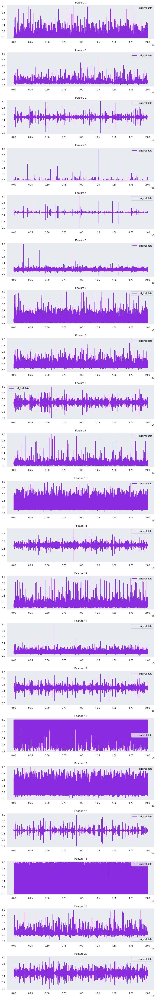

In [38]:
# 1. Извлечь данные из train_loader в виде numpy массива
train_data = []
for batch in train_loader:
    batch = batch.squeeze(1)  # убираем лишнее измерение
    batch = batch.numpy()  # преобразуем в numpy array
    for seq in batch:
        train_data.append(seq)
train_data = np.array(train_data)

# 2. Перестроить данные в подходящий формат для построения графиков
train_data = train_data.reshape(-1, seq_len, n_features)

# 3. Создать подграфики для каждой фичи
fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# 4. Построить график для каждой фичи
for i in range(n_features):
    line, = axs[i].plot(train_data[:, 0, i], color='blueviolet', label='original data')
    for j in range(1, seq_len):
        axs[i].plot(train_data[:, j, i], color='blueviolet')
    axs[i].set_title(f'Feature {i}')
    axs[i].legend(handles=[line])  # Добавить легенду

plt.tight_layout()
plt.show()

In [39]:
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

parser = argparse.ArgumentParser()
args = parser.parse_args('')

args.device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ===== data loading ==== #
args.batch_size = 128

# ==== model capacity ==== #
args.n_layers = 1
args.embedding_dim = 128


# ==== regularization ==== #
# args.dropout = 0  # Установка значения dropout
args.use_bn = False  # batch normalization

# ==== optimizer & training  # ====
args.lr = 0.001
args.epoch = 180
args.patience = 20

In [40]:
class Encoder(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(Encoder, self).__init__()
        self.seq_len, self.n_features = seq_len, n_features
        self.hidden_dim = 2 * args.embedding_dim
        self.lstm1 = nn.LSTM(
            input_size=n_features,
            hidden_size=self.hidden_dim,
            num_layers=args.n_layers,
            batch_first=True,
            dtype=torch.float32
        ).to(args.device)
        self.lstm2 = nn.LSTM(
            input_size=self.hidden_dim,
            hidden_size=args.embedding_dim,
            num_layers=args.n_layers,
            batch_first=True,
            dtype=torch.float32
        ).to(args.device)

    def forward(self, x):
        x = x.to(args.device).to(torch.float32)
        batch_size = x.size(0)

        # print(f'ENCODER input dim: {x.shape}')
        x = x.reshape((batch_size, self.seq_len, self.n_features))
        # print(f'ENCODER reshaped dim: {x.shape}')
        x, (_, _) = self.lstm1(x)
        # print(f'ENCODER output lstm1 dim: {x.shape}')
        x, (hidden_n, _) = self.lstm2(x)
        # print(f'ENCODER output lstm2 dim: {x.shape}')
        # print(f'ENCODER hidden_n lstm2 dim: {hidden_n.shape}')
        # print(f'ENCODER hidden_n wants to be reshaped to : {(batch_size, args.embedding_dim)}')
        return hidden_n.reshape((batch_size, args.embedding_dim))

class Decoder(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(Decoder, self).__init__()
        self.seq_len, self.input_dim = seq_len, args.embedding_dim
        self.hidden_dim, self.n_features = 2 * args.embedding_dim, n_features
        self.lstm1 = nn.LSTM(
            input_size=args.embedding_dim,
            hidden_size=args.embedding_dim,
            num_layers=1,
            batch_first=True
        ).to(args.device)
        self.lstm2 = nn.LSTM(
            input_size=args.embedding_dim,
            hidden_size=self.hidden_dim,
            num_layers=1,
            batch_first=True
        ).to(args.device)
        self.output_layer = nn.Linear(self.hidden_dim, n_features).to(args.device)

    def forward(self, x):
        batch_size = x.size(0)
        x = x.to(args.device)
        # print(f'DECODER input dim: {x.shape}')
        x = x.repeat_interleave(self.seq_len, dim=0)
        # print(f'DECODER repeat dim: {x.shape}')
        x = x.reshape((batch_size, self.seq_len, self.input_dim))
        # print(f'DECODER reshaped dim: {x.shape}')
        x, (hidden_n, cell_n) = self.lstm1(x)
        # print(f'DECODER output rnn1 dim:/ {x.shape}')
        x, (hidden_n, cell_n) = self.lstm2(x)
        x = x.reshape((batch_size, self.seq_len, self.hidden_dim))
        return self.output_layer(x)

class LSTM_AUTO_ENCODER(nn.Module):
    def __init__(self, seq_len, n_features, args):
        super(LSTM_AUTO_ENCODER, self).__init__()
        self.seq_len = seq_len
        self.n_features = n_features
        self.encoder = Encoder(seq_len, n_features, args)
        self.decoder = Decoder(seq_len, n_features, args)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [41]:
class EarlyStopping:
    def __init__(self, patience=20, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

Проверка работоспособности модели

In [42]:
# encoder = Encoder(seq_len, n_features)

# for batch in train_loader:
#     output = encoder(batch)
#     print(f'Input shape: {batch.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)


In [43]:
# decoder = Decoder(seq_len, n_features)

# for batch in train_loader:
#     input_tensor = torch.randn(batch.size(0), args.embedding_dim)  # Создаем случайный входной тензор для декодера
#     output = decoder(input_tensor)
#     print(f'Input shape: {input_tensor.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)
#     break  # Выходим из цикла после первой итерации

In [44]:
# model = LSTM_AUTO_ENCODER(seq_len, n_features, args)

# for batch in train_loader:
#     input_tensor = batch
#     output = model(input_tensor)
#     print(f'Input shape: {input_tensor.shape}')
#     print(f'Output shape: {output.shape}')
#     print('-' * 30)
#     break

In [45]:
def train_model(model,train_loader, val_loader, n_epochs, n_features, args):
    early_stopping = EarlyStopping(patience=args.patience)
    # Установка режима обучения
    model.train()
    
    # Оптимизатор и функция потерь
    optimizer = torch.optim.Adam(model.parameters(), lr=args.lr)
    criterion = nn.MSELoss(reduction='sum').to(args.device)

    # История обучения
    history = {'train': [], 'val': []}

    # Переменная для отслеживания лучшей модели
    best_model_wts = None
    best_val_loss = float('inf')

    # Цикл обучения
    for epoch in range(1, n_epochs + 1):
        model = model.train()
        ts = time.time()
        train_losses = []

        # Создание DataLoader для обучающего набора данных
        train_loader = DataLoader(train_data, batch_size=args.batch_size, shuffle=False)
        train_loader = tqdm(train_loader, desc=f'Epoch {epoch}', leave=False)

        for seq_true in train_loader:
            optimizer.zero_grad()

            # Изменение формы входных данных на (batch_size, seq_len, n_features)
            seq_true = seq_true.reshape((-1, seq_len, n_features))
            seq_true = seq_true.float().to(args.device)

            seq_pred = model(seq_true)
    
            loss = criterion(seq_pred, seq_true)
            
            loss.backward()
            optimizer.step()

            train_losses.append(loss.item())
            # Обновление tqdm
            train_loader.set_postfix(train_loss=np.mean(train_losses))

        val_losses = []
        model = model.eval()
        with torch.no_grad():
            for seq_true in val_loader:

                # Изменение формы входных данных на (batch_size, seq_len, n_features)
                seq_true = seq_true.reshape((-1, seq_len, n_features))
                seq_true = seq_true.float().to(args.device)

                seq_pred = model(seq_true)

                loss = criterion(seq_pred, seq_true)

                val_losses.append(loss.item())
        te = time.time()
        train_loss = np.mean(train_losses)
        val_loss = np.mean(val_losses)
        history['train'].append(train_loss)
        history['val'].append(val_loss)
        
        # Вызов EarlyStopping и проверка на необходимость остановки
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print(f"Early stopping at epoch {epoch}")
            break
        
        print(f"Epoch: {epoch}  train loss: {train_loss}  val loss: {val_loss}  time: {te-ts} ")
        # Построение графиков каждые 10 эпох
        if epoch % 10 == 0:
            # 1. Извлечь данные из val_loader в виде numpy массива
            val_data_np = torch.cat([batch for batch in val_loader], dim=0).detach().cpu().numpy()

            # 2. Перестроить данные в подходящий формат для построения графиков
            val_data_np = val_data_np.reshape(-1, seq_len, n_features)

            # 3. Получить предсказания модели
            preds = []
            with torch.no_grad():
                model = model.eval()
                for seq_true in val_loader:
                    seq_true = seq_true.to(args.device)
                    seq_true = seq_true.reshape((-1, seq_len, n_features))

                    seq_pred = model(seq_true)
                    preds.append(seq_pred.cpu().numpy())
            preds = np.concatenate(preds, axis=0)

            # 4. Создать подграфики для каждой фичи
            fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

            # 5. Построить график для каждой фичи
            for i in range(n_features):
                line1, = axs[i].plot(val_data_np[:, 0, i], color='blueviolet', label='original data')

                line2, = axs[i].plot(preds[:, 0, i], color='orange', label='predictions')
                for j in range(1, seq_len):
                    axs[i].plot(val_data_np[:, j, i], color='blueviolet')
                    axs[i].plot(preds[:, j, i], color='orange')
                axs[i].set_title(f'Feature {i}')
                axs[i].legend(handles=[line1, line2])

            plt.tight_layout()
            plt.show()

        # Сохранение лучшей модели
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())

    # Загрузка весов лучшей модели
    model.load_state_dict(best_model_wts)

    return model.eval(), history


In [46]:
model = LSTM_AUTO_ENCODER(seq_len=seq_len, n_features=n_features, args=args)
model = model.to(args.device)
model

LSTM_AUTO_ENCODER(
  (encoder): Encoder(
    (lstm1): LSTM(21, 256, batch_first=True)
    (lstm2): LSTM(256, 128, batch_first=True)
  )
  (decoder): Decoder(
    (lstm1): LSTM(128, 128, batch_first=True)
    (lstm2): LSTM(128, 256, batch_first=True)
    (output_layer): Linear(in_features=256, out_features=21, bias=True)
  )
)

Epoch: 1  train loss: 3.8346127447542546  val loss: 0.8135441361477994  time: 150.77686095237732 


Epoch: 2  train loss: 1.0236915881043076  val loss: 0.7595317683447734  time: 147.97985458374023 


Epoch: 3  train loss: 0.9190230843917131  val loss: 0.7220014646416234  time: 148.42684507369995 


Epoch: 4  train loss: 0.8041824575121999  val loss: 0.5416775308738745  time: 148.60573506355286 


Epoch: 5  train loss: 0.5856842421411574  val loss: 0.41386280879153475  time: 148.15937876701355 


Epoch: 6  train loss: 0.41288544475775957  val loss: 0.21515135246173986  time: 148.69212007522583 


Epoch: 7  train loss: 0.2670354662521183  val loss: 0.17467489757834256  time: 155.8497052192688 


Epoch: 8  train loss: 0.23064742563521862  val loss: 0.16446149284289285  time: 159.14109206199646 


Epoch: 9  train loss: 0.2193235724786222  val loss: 0.15582023721852184  time: 159.7334496974945 


Epoch: 10  train loss: 0.20652314146994055  val loss: 0.14793966628218796  time: 159.49956464767456 


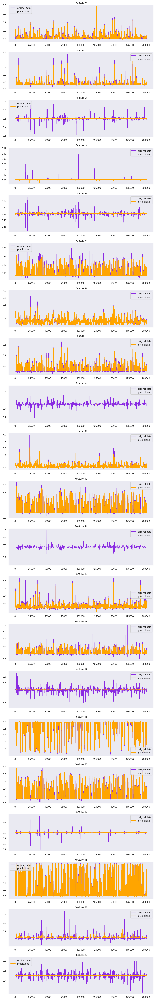

Epoch: 11  train loss: 0.19280723801189661  val loss: 0.13949695958686684  time: 157.18363642692566 


Epoch: 12  train loss: 0.1805352816094905  val loss: 0.12060548550914678  time: 154.44805788993835 


Epoch: 13  train loss: 0.15540650251325966  val loss: 0.08494043504532896  time: 154.4223654270172 


Epoch: 14  train loss: 0.09844531242758035  val loss: 0.05503448953766558  time: 154.07700991630554 


Epoch: 15  train loss: 0.07908196216006577  val loss: 0.038705682344045346  time: 154.6342453956604 


Epoch: 16  train loss: 0.06566006343775616  val loss: 0.04196756366180881  time: 154.77138328552246 


Epoch: 17  train loss: 0.0623430084307678  val loss: 0.03326372018473263  time: 154.39529466629028 


Epoch: 18  train loss: 0.05998642019364983  val loss: 0.03545652415813154  time: 154.74398183822632 


Epoch: 19  train loss: 0.05838768075038865  val loss: 0.03518019044194003  time: 154.64116144180298 


Epoch: 20  train loss: 0.05419758200387657  val loss: 0.03159263756261071  time: 154.14187955856323 


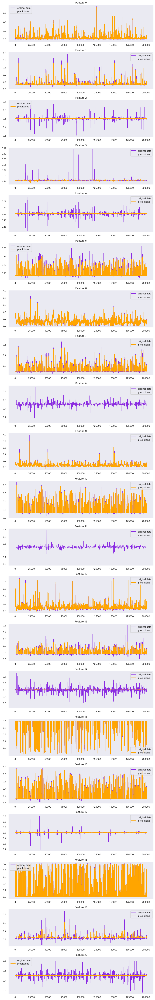

Epoch: 21  train loss: 0.05429111463129893  val loss: 0.035906579706618466  time: 156.05982494354248 


Epoch: 22  train loss: 0.05305965665520355  val loss: 0.02998721363708398  time: 155.0487711429596 


Epoch: 23  train loss: 0.05106252266843245  val loss: 0.03165086115178802  time: 154.83524703979492 


Epoch: 24  train loss: 0.049499710006501524  val loss: 0.02945329119228572  time: 155.01143431663513 


Epoch: 25  train loss: 0.04758473881961778  val loss: 0.036720144615823395  time: 155.05107641220093 


Epoch: 26  train loss: 0.04844973068854213  val loss: 0.028609828950998194  time: 155.1588957309723 


Epoch: 27  train loss: 0.047827615297604355  val loss: 0.030454003129313015  time: 155.4072756767273 


Epoch: 28  train loss: 0.04483984200636298  val loss: 0.03560913505838543  time: 155.0786292552948 


Epoch: 29  train loss: 0.044531979793824256  val loss: 0.030128278777096777  time: 155.19329404830933 


Epoch: 30  train loss: 0.045450653417907654  val loss: 0.02587301040656558  time: 155.6188497543335 


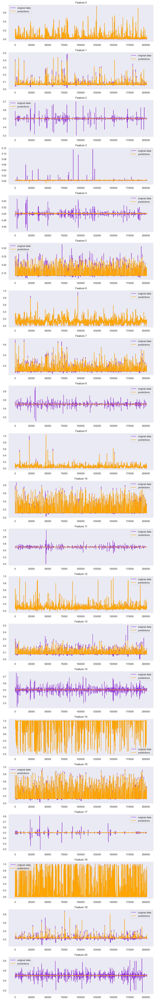

Epoch: 31  train loss: 0.04484221774843708  val loss: 0.031412723221330346  time: 156.33755660057068 


Epoch: 32  train loss: 0.04507066160995513  val loss: 0.02373742131793545  time: 155.94914150238037 


Epoch: 33  train loss: 0.043002721561089155  val loss: 0.02745095382332435  time: 156.45138955116272 


Epoch: 34  train loss: 0.04356810771665722  val loss: 0.02144659963579392  time: 156.09392881393433 


Epoch: 35  train loss: 0.04121349976395443  val loss: 0.02657468543603769  time: 155.87350273132324 


Epoch: 36  train loss: 0.04289143898235261  val loss: 0.02148842053786553  time: 155.92432641983032 


Epoch: 37  train loss: 0.04141113750131801  val loss: 0.022952415353852725  time: 155.94261693954468 


Epoch: 38  train loss: 0.04132399734677002  val loss: 0.0252997018773688  time: 156.72409343719482 


Epoch: 39  train loss: 0.04072216611886397  val loss: 0.02270113037855647  time: 156.10115671157837 


Epoch: 40  train loss: 0.04142642353648692  val loss: 0.02446833237079049  time: 156.05382227897644 


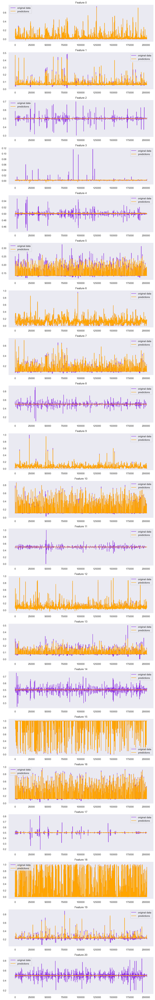

Epoch: 41  train loss: 0.04109493233126402  val loss: 0.020855498034303643  time: 157.03987312316895 


Epoch: 42  train loss: 0.03959069709768333  val loss: 0.021896177759739302  time: 156.36335396766663 


Epoch: 43  train loss: 0.04018806512102857  val loss: 0.025921636924239762  time: 156.49990129470825 


Epoch: 44  train loss: 0.03989958710723743  val loss: 0.02162305204110638  time: 157.61150598526 


Epoch: 45  train loss: 0.03974722383212112  val loss: 0.026625749430816806  time: 159.64135813713074 


Epoch: 46  train loss: 0.03951802679662406  val loss: 0.021947408922224007  time: 156.43922758102417 


Epoch: 47  train loss: 0.04019529008386284  val loss: 0.023315741724828424  time: 161.16674494743347 


Epoch: 48  train loss: 0.038320411024272444  val loss: 0.02153094581492823  time: 169.66945910453796 


Epoch: 49  train loss: 0.03818924203638919  val loss: 0.02107126638533641  time: 156.71009588241577 


Epoch: 50  train loss: 0.03803538153092563  val loss: 0.022263442808449337  time: 156.67631840705872 


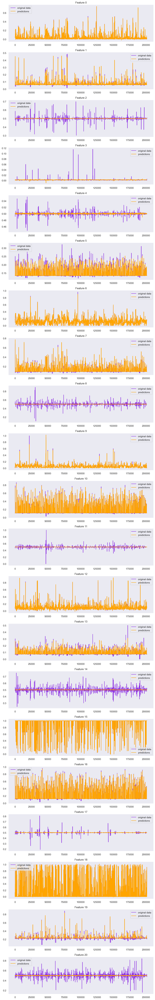

Epoch: 51  train loss: 0.03864190435829014  val loss: 0.020508518106005454  time: 157.27288222312927 


Epoch: 52  train loss: 0.03721718223770335  val loss: 0.018751378133980288  time: 156.1507158279419 


Epoch: 53  train loss: 0.034695934337431567  val loss: 0.02287010135260154  time: 156.1313817501068 


Epoch: 54  train loss: 0.03523529484640434  val loss: 0.01906315056401736  time: 156.4901578426361 


Epoch: 55  train loss: 0.0341356654108651  val loss: 0.018577575973559614  time: 156.73881244659424 


Epoch: 56  train loss: 0.034832710356807337  val loss: 0.023285180750377523  time: 156.20175170898438 


Epoch: 57  train loss: 0.03434767732501402  val loss: 0.022886049370921903  time: 156.3879988193512 


Epoch: 58  train loss: 0.03510090767507814  val loss: 0.0185326032253326  time: 156.2639844417572 


Epoch: 59  train loss: 0.033163812826823444  val loss: 0.02267131362325752  time: 155.75091814994812 


Epoch: 60  train loss: 0.034084679792243985  val loss: 0.01856141180179308  time: 155.88302993774414 


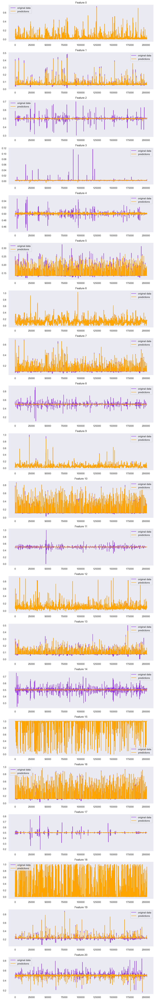

Epoch: 61  train loss: 0.03297786497467384  val loss: 0.017865796461519447  time: 161.61257600784302 


Epoch: 62  train loss: 0.0329446047726851  val loss: 0.020583585988279914  time: 157.03335165977478 


Epoch: 63  train loss: 0.03210950988784433  val loss: 0.016873896919412622  time: 156.31870245933533 


Epoch: 64  train loss: 0.031266703777771444  val loss: 0.01726985714988389  time: 156.2867193222046 


Epoch: 65  train loss: 0.031565622220961376  val loss: 0.01918287826687946  time: 157.21984148025513 


Epoch: 66  train loss: 0.03034645981498435  val loss: 0.023171281406729572  time: 157.15817880630493 


Epoch: 67  train loss: 0.03151137906825729  val loss: 0.01467639054388448  time: 156.89113903045654 


Epoch: 68  train loss: 0.030010913263343274  val loss: 0.017498612864945307  time: 156.13130450248718 


Epoch: 69  train loss: 0.030408752951867877  val loss: 0.01580162478657913  time: 156.0616853237152 


Epoch: 70  train loss: 0.030347927823521196  val loss: 0.020332095477128876  time: 156.23482036590576 


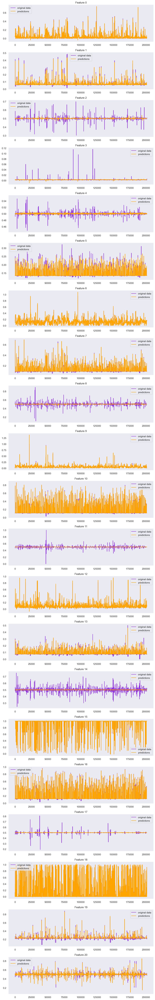

Epoch: 71  train loss: 0.02983436419471167  val loss: 0.018312869256273862  time: 157.07320261001587 


Epoch: 72  train loss: 0.029408986745789647  val loss: 0.01675525157276915  time: 156.00940322875977 


Epoch: 73  train loss: 0.03020612556306645  val loss: 0.016861429806470898  time: 156.5401692390442 


Epoch: 74  train loss: 0.0282924828650672  val loss: 0.01678906649044476  time: 156.7008035182953 


Epoch: 75  train loss: 0.028955674204165116  val loss: 0.017263474159471968  time: 156.67505741119385 


Epoch: 76  train loss: 0.02876925286672637  val loss: 0.01632128358929385  time: 156.964613199234 


Epoch: 77  train loss: 0.0278374482768476  val loss: 0.01649076404992853  time: 157.32353568077087 


Epoch: 78  train loss: 0.02759984807074256  val loss: 0.019126993637213072  time: 156.2993941307068 


Epoch: 79  train loss: 0.027954459168836474  val loss: 0.015939798012681736  time: 156.86880540847778 


Epoch: 80  train loss: 0.027121899822313337  val loss: 0.016499838705733478  time: 156.62051463127136 


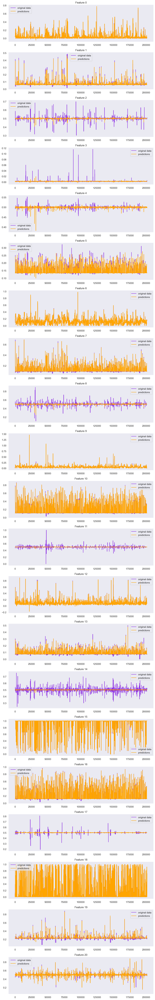

Epoch: 81  train loss: 0.027374577411998065  val loss: 0.015476615239231193  time: 157.69977116584778 


Epoch: 82  train loss: 0.027938200718536973  val loss: 0.015997816394189707  time: 156.4546675682068 


Epoch: 83  train loss: 0.027163623800899834  val loss: 0.014541983472077137  time: 157.25397276878357 


Epoch: 84  train loss: 0.02801512042385526  val loss: 0.015147129874445706  time: 157.14617323875427 


Epoch: 85  train loss: 0.026351564409159124  val loss: 0.022049265001498737  time: 156.6029212474823 


Epoch: 86  train loss: 0.02718104639985226  val loss: 0.013200897708089354  time: 157.00858402252197 


Epoch: 87  train loss: 0.026295921946961433  val loss: 0.014796607306570566  time: 156.94175696372986 


Epoch: 88  train loss: 0.026589283082414417  val loss: 0.01332183948557811  time: 157.11601185798645 


Epoch: 89  train loss: 0.026873773188436405  val loss: 0.01545945115041596  time: 157.02401781082153 


Epoch: 90  train loss: 0.025915260797861963  val loss: 0.014797356497891913  time: 156.65831065177917 


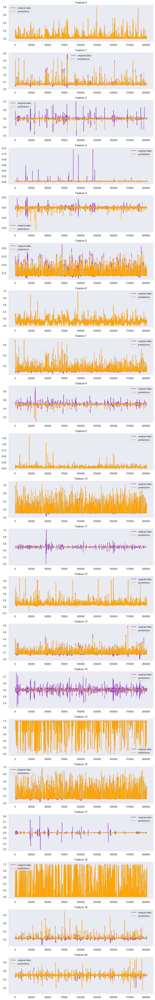

Epoch: 91  train loss: 0.02614447704642825  val loss: 0.015594091983006148  time: 157.99019050598145 


Epoch: 92  train loss: 0.025878109020156786  val loss: 0.01328189687651323  time: 156.49514651298523 


Epoch: 93  train loss: 0.025753058734074234  val loss: 0.013171002627892527  time: 156.86103224754333 


Epoch: 94  train loss: 0.025498721238257364  val loss: 0.014223048599330967  time: 157.27855467796326 


Epoch: 95  train loss: 0.025450032498706133  val loss: 0.014531769700890663  time: 157.85568499565125 


Epoch: 96  train loss: 0.02536434266073443  val loss: 0.013059561853731208  time: 157.37288784980774 


Epoch: 97  train loss: 0.024804173574930057  val loss: 0.014364474251006317  time: 157.01672172546387 


Epoch: 98  train loss: 0.025100944823321886  val loss: 0.014893798361410502  time: 158.6034173965454 


Epoch: 99  train loss: 0.024664411298204212  val loss: 0.015049029005538457  time: 157.34705066680908 


Epoch: 100  train loss: 0.02467762974845432  val loss: 0.015453385335101546  time: 157.6318871974945 


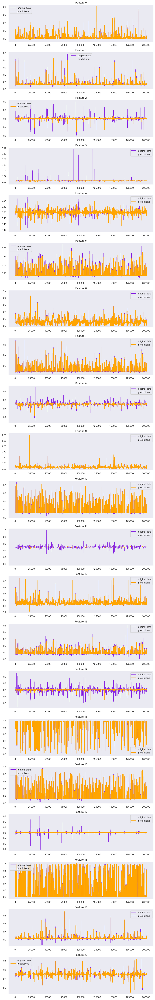

Epoch: 101  train loss: 0.024164551187844947  val loss: 0.012729294476805791  time: 158.4304974079132 


Epoch: 102  train loss: 0.025632038884369657  val loss: 0.012597368015570293  time: 157.6915316581726 


Epoch: 103  train loss: 0.023934224620848894  val loss: 0.013131343100507379  time: 157.39332127571106 


Epoch: 104  train loss: 0.023957116391576827  val loss: 0.014149428805377184  time: 157.59460496902466 


Epoch: 105  train loss: 0.023980394957153126  val loss: 0.0125899218547247  time: 157.29962801933289 


Epoch: 106  train loss: 0.023250086771151052  val loss: 0.01386417004848112  time: 158.28189492225647 


Epoch: 107  train loss: 0.02385380544310808  val loss: 0.014136237284357055  time: 157.09202980995178 


Epoch: 108  train loss: 0.023687522872632368  val loss: 0.015124167894669116  time: 157.18054223060608 


Epoch: 109  train loss: 0.02278960244258307  val loss: 0.015421533983491014  time: 157.93678975105286 


Epoch: 110  train loss: 0.023360434981167317  val loss: 0.014243803542286182  time: 158.4604206085205 


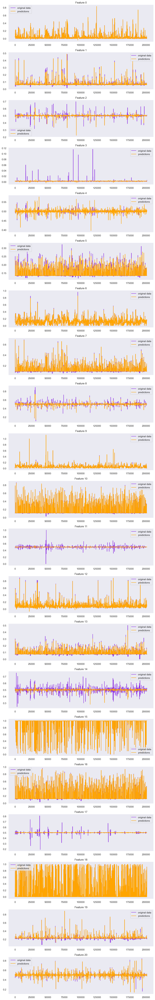

Epoch: 111  train loss: 0.02307967546551302  val loss: 0.012860424429318543  time: 158.73844575881958 


Epoch: 112  train loss: 0.022419441560022534  val loss: 0.011991511109154737  time: 157.9488525390625 


Epoch: 113  train loss: 0.022591823868595064  val loss: 0.013147711880060428  time: 157.2942361831665 


Epoch: 114  train loss: 0.022052902545930817  val loss: 0.011531722494213175  time: 157.47214770317078 


Epoch: 115  train loss: 0.022315197459192946  val loss: 0.01449204447321692  time: 157.78519868850708 


Epoch: 116  train loss: 0.02200170311350748  val loss: 0.012643731815063423  time: 157.64144897460938 


Epoch: 117  train loss: 0.022026874926207588  val loss: 0.01965236194385038  time: 157.83209800720215 


Epoch: 118  train loss: 0.021758046249568463  val loss: 0.012582722594634615  time: 157.89520978927612 


Epoch: 119  train loss: 0.02159703250089567  val loss: 0.013778769490285392  time: 158.128271818161 


Epoch: 120  train loss: 0.021617833996243774  val loss: 0.018483193618787707  time: 158.7116937637329 


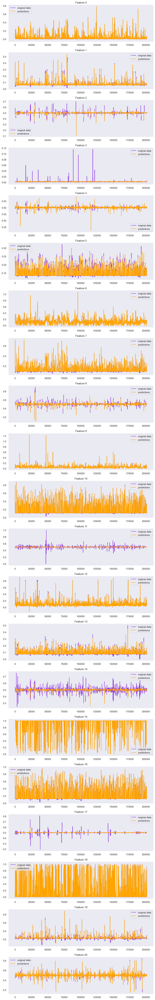

Epoch: 121  train loss: 0.02187410623379424  val loss: 0.011948349595011011  time: 159.0794334411621 


Epoch: 122  train loss: 0.021192141967186703  val loss: 0.012212313709239472  time: 157.44694662094116 


Epoch: 123  train loss: 0.021215588757390158  val loss: 0.014065335057650692  time: 157.7878065109253 


Epoch: 124  train loss: 0.020781885260952638  val loss: 0.012397742004751635  time: 157.81617665290833 


Epoch: 125  train loss: 0.021746770227143542  val loss: 0.01186904819232407  time: 157.25154280662537 


Epoch: 126  train loss: 0.02049720720081404  val loss: 0.012842130519699997  time: 158.09511756896973 


Epoch: 127  train loss: 0.020372012271620332  val loss: 0.013231859538823826  time: 157.93378925323486 


Epoch: 128  train loss: 0.02007063335687481  val loss: 0.019921467706514935  time: 157.98250007629395 


Epoch: 129  train loss: 0.02070512118675001  val loss: 0.015277727386423681  time: 158.07452297210693 


Epoch: 130  train loss: 0.02015850632276945  val loss: 0.015489206958115113  time: 157.65486550331116 


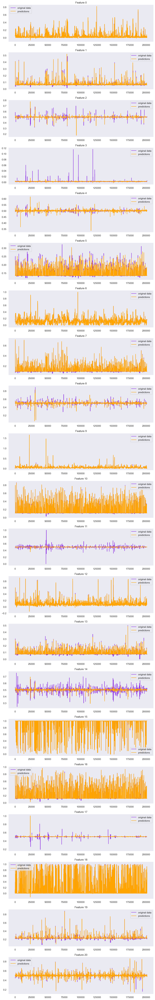

Epoch: 131  train loss: 0.020308374082280322  val loss: 0.014554558088337314  time: 158.28238320350647 


Epoch: 132  train loss: 0.02041130889057927  val loss: 0.015479673872196814  time: 157.23723649978638 


Epoch: 133  train loss: 0.020371965028204025  val loss: 0.012447952505702116  time: 157.34611558914185 


Early stopping at epoch 134


In [47]:
model, history = train_model(model, train_loader,val_loader , args.epoch, n_features, args)

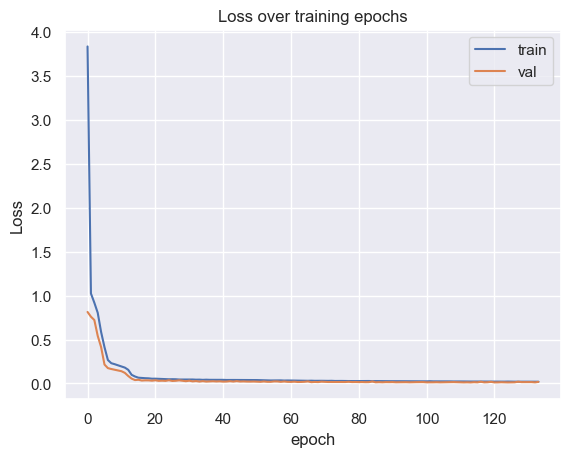

In [48]:
sns.set(style='dark')
plt.plot(history['train'])
plt.plot(history['val'])
plt.ylabel('Loss')
plt.xlabel('epoch')
# plt.ylim(0, 1)
plt.title('Loss over training epochs')
plt.legend(['train','val'])
plt.grid()
plt.savefig('all_pics/losses.png', dpi=300)
plt.show();

In [49]:
MODEL_PATH = 'lstmae.pth'
torch.save(model, MODEL_PATH)

In [50]:
model = torch.load('lstmae.pth')
model = model.to(args.device)
model

LSTM_AUTO_ENCODER(
  (encoder): Encoder(
    (lstm1): LSTM(21, 256, batch_first=True)
    (lstm2): LSTM(256, 128, batch_first=True)
  )
  (decoder): Decoder(
    (lstm1): LSTM(128, 128, batch_first=True)
    (lstm2): LSTM(128, 256, batch_first=True)
    (output_layer): Linear(in_features=256, out_features=21, bias=True)
  )
)

In [51]:
class Create_dataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=1):
        self.data = data
        self.seq_len = seq_len
        self.batch_size = batch_size
        self.n_samples, self.n_features = self.data.shape
        self.dataset = self.create_dataset(self.data, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data.iloc[i:i+self.seq_len].values.astype(np.float32)
            sequences.append(torch.from_numpy(sequence))
        return DataLoader(sequences, batch_size=batch_size, shuffle=False)

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return len(self.data) - self.seq_len + 1

In [52]:
class encdataset(Dataset):
    def __init__(self, data, seq_len=1, batch_size=1):
        # data load
        self.data = data
        self.features = self.data.values.astype(np.float32)
        self.n_samples, self.n_features = self.data.shape
        self.seq_len = seq_len
        self.train_df = self.data[0:2000000]
        self.val_df = self.data[2000000:]
        
        # создание датасета
        self.train_dataset = self.create_dataset(self.train_df, batch_size)
        self.val_dataset = self.create_dataset(self.val_df, batch_size)

    def create_dataset(self, data, batch_size):
        sequences = []
        for i in range(len(data) - self.seq_len + 1):
            sequence = data[i:i+self.seq_len].values  # Изменение здесь
            sequences.append(torch.from_numpy(sequence))
        dataset = DataLoader(sequences, batch_size=batch_size, shuffle=False)
        return dataset

    def __getitem__(self, index):
        return self.data.iloc[index]

    def __len__(self):
        return self.n_samples


In [53]:
dataset = encdataset(df)
train_loader = dataset.train_dataset
val_loader = dataset.val_dataset
seq_len = dataset.seq_len
n_features = dataset.n_features

In [54]:
anomaly = Create_dataset(anom)
anomaly_loader=anomaly.dataset

In [55]:
anomaly_loader

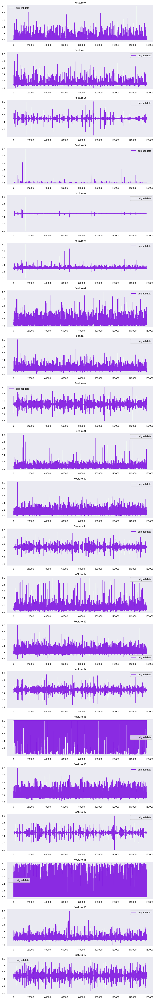

In [56]:
# 1. Извлечь данные из train_loader в виде numpy массива
anom_data = []
for batch in anomaly_loader:
    batch = batch.squeeze(1)  # убираем лишнее измерение
    batch = batch.numpy()  # преобразуем в numpy array
    for seq in batch:
        anom_data.append(seq)
anom_data = np.array(anom_data)

# 2. Перестроить данные в подходящий формат для построения графиков
anom_data = anom_data.reshape(-1, seq_len, n_features)

# 3. Создать подграфики для каждой фичи
fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# 4. Построить график для каждой фичи
for i in range(n_features):
    line, = axs[i].plot(anom_data[:, 0, i], color='blueviolet', label='original data')
    for j in range(1, seq_len):
        axs[i].plot(anom_data[:, j, i], color='blueviolet')
    axs[i].set_title(f'Feature {i}')
    axs[i].legend(handles=[line])  # Добавить легенду

plt.tight_layout()
plt.show()

In [57]:
def predict(model, dataset):
    predictions, losses = [], []
    criterion = nn.MSELoss(reduction='sum').to(args.device)

    with torch.no_grad():
        model = model.eval()
        for seq_true in dataset:
            seq_true = seq_true.to(device=args.device)
            seq_pred = model(seq_true)

            loss = criterion(seq_pred, seq_true)

            predictions.append(seq_pred.cpu().numpy())
            losses.append(loss.item())
    return predictions, losses

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


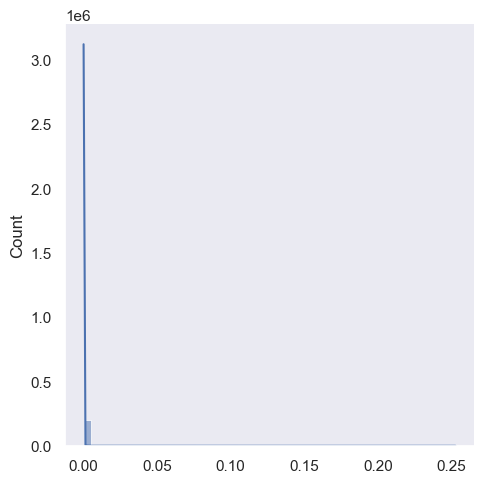

In [58]:
val_pred, val_losses = predict(model,val_loader)
sns.displot(val_losses, bins=50, kde=True);

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


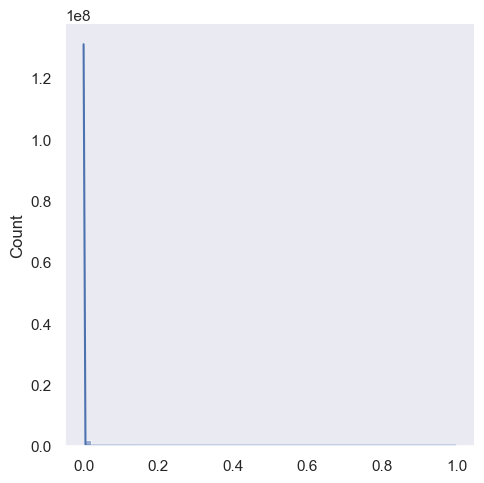

In [59]:
train_pred, train_losses = predict(model,train_loader)
sns.displot(train_losses, bins=50, kde=True);

d:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


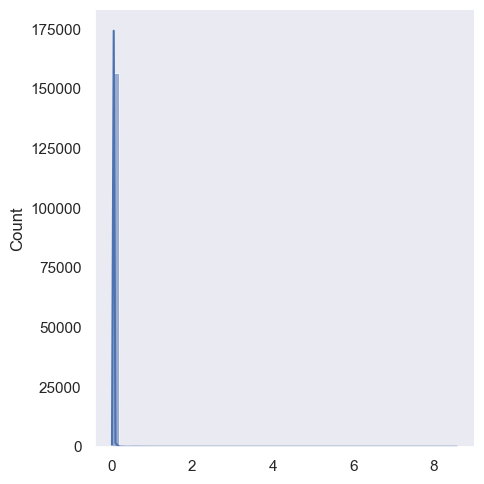

In [60]:
anom_pred, anom_losses = predict(model,anomaly_loader)
sns.displot(anom_losses, bins=50, kde=True);

In [61]:
len(anom_losses)+len(val_losses)

357999

In [62]:
len(val_loader)

201368

In [89]:
Threshold = 0.01

In [90]:
corect_train= sum(l<= Threshold for l in train_losses)
print(f'Correct normal predictions: {corect_train}/{len(train_loader)}')
detected_train=corect_train/len(train_loader)
print(f'correct detected normal: {detected_train}')
corect_normal= sum(l<= Threshold for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> Threshold for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: 1997195/2000000
correct detected normal: 0.9985975
Correct normal predictions: 201144/201368
correct detected normal: 0.9988876087561083
Correct anomaly predictions: 156587/156631
correct detected anomaly: 0.9997190849831771


In [80]:
df['Failure']=0
anom['Failure']=1

In [86]:
th=np.arange( 0.001,0.1,1e-4)
th.shape

(990,)

In [87]:
corect_normal= sum(l<= th for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> th for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: [199501 199631 199757 199868 199965 200041 200117 200179 200249 200311
 200356 200398 200431 200477 200506 200552 200575 200603 200627 200646
 200669 200689 200706 200723 200745 200761 200771 200791 200801 200816
 200827 200839 200850 200862 200871 200882 200890 200899 200914 200918
 200926 200933 200936 200939 200945 200952 200959 200964 200971 200976
 200980 200981 200988 200992 200999 201002 201009 201015 201021 201027
 201031 201037 201039 201043 201047 201050 201057 201060 201063 201067
 201070 201072 201078 201081 201084 201088 201091 201094 201097 201100
 201105 201109 201116 201123 201124 201134 201137 201141 201144 201144
 201144 201147 201151 201154 201156 201160 201162 201165 201166 201169
 201173 201175 201178 201181 201187 201190 201193 201194 201195 201197
 201198 201201 201203 201205 201205 201209 201210 201211 201215 201216
 201216 201221 201222 201223 201226 201227 201228 201230 201231 201231
 201232 201233 201235 201238 201238 201241 201242

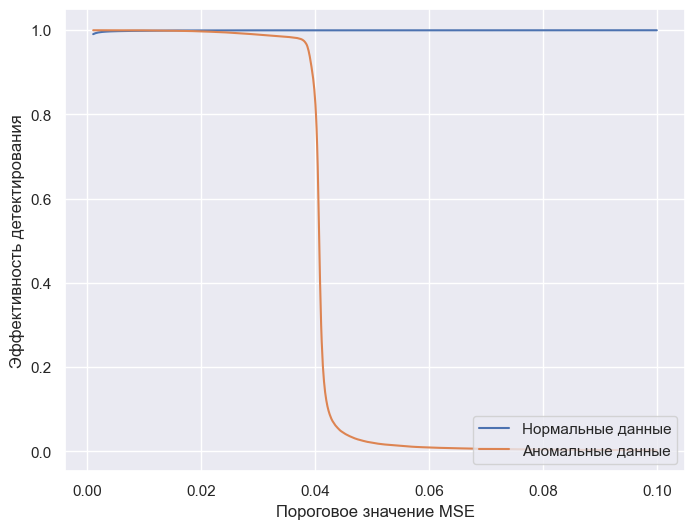

In [88]:
sns.set(style='dark')
plt.figure(figsize=(8,6))
plt.plot(th ,detected_normal)
plt.plot(th ,detected_anomaly)
plt.ylabel('Эффективность детектирования')
plt.xlabel('Пороговое значение MSE')
# plt.ylim(0, 1)
# plt.title('Зависимость эффективности модели от ошибки реконструкции по MSE')
plt.legend(['Нормальные данные','Аномальные данные'], loc='lower right')
plt.grid()
plt.savefig('all_pics/threshhold.png', dpi=300)
plt.show();

In [85]:
combined_df = np.concatenate((df[2000000:], anom), axis=0)

In [91]:
combined_df = pd.DataFrame(combined_df, columns=df.columns)

In [92]:
combined_df.shape

(357999, 22)

In [93]:
X=combined_df.drop(['Failure'], axis=1)
y=combined_df['Failure']

In [94]:
combo = Create_dataset(X)
combo_loader=combo.dataset

In [95]:
losses=val_losses+ anom_losses

In [96]:
Threshold = 0.01

In [97]:
score = pd.DataFrame(index = X.index)
score['Loss'] = losses
score['Threshold'] = Threshold
score['Anomaly'] = score['Loss'] > score['Threshold']

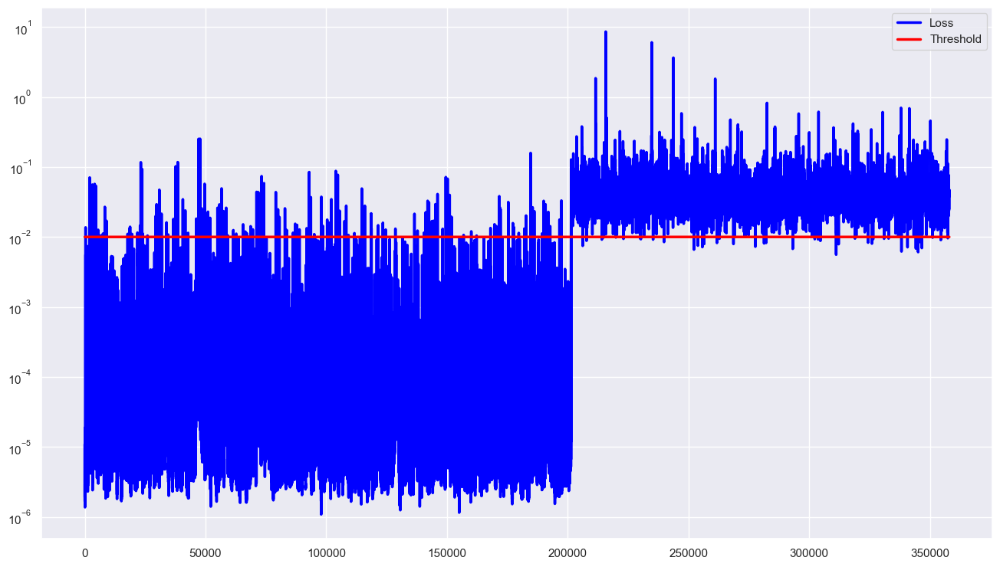

In [98]:
sns.set(style='dark')
score.plot(logy=True, figsize=(16,9), color=['blue','red'],linewidth=2.5)
plt.savefig('all_pics/score_plot_failure.png', dpi=300)
plt.grid()
# Отображение графика
plt.show()

In [99]:
corect_normal= sum(l<= Threshold for l in val_losses)
print(f'Correct normal predictions: {corect_normal}/{len(val_loader)}')
detected_normal=corect_normal/len(val_loader)
print(f'correct detected normal: {detected_normal}')
corect_anomaly= sum(l> Threshold for l in anom_losses)
print(f'Correct anomaly predictions: {corect_anomaly}/{len(anomaly_loader)}')
detected_anomaly=corect_anomaly/len(anomaly_loader)
print(f'correct detected anomaly: {detected_anomaly}')

Correct normal predictions: 201144/201368
correct detected normal: 0.9988876087561083
Correct anomaly predictions: 156587/156631
correct detected anomaly: 0.9997190849831771


In [100]:
from sklearn.metrics import  roc_auc_score, classification_report, accuracy_score, f1_score, precision_score, recall_score

In [101]:
def metrics(y_true,y_pred):
    acc=accuracy_score(y_true, y_pred)
    f1=f1_score(y_true, y_pred, average='binary')
    roc_auc=roc_auc_score(y_true, y_pred)
    precision=precision_score(y_true, y_pred)
    recall=recall_score(y_true, y_pred)
    
        # Создание DataFrame
    metrics_df = pd.DataFrame({
        'Метрика': ['Recall', 'Precision', 'F1', 'roc_auc', 'accuracy', 'detected normal', 'detected anomaly'],
        'Значение': [recall, precision, f1, roc_auc, acc, detected_normal, detected_anomaly]
    })

    # # Сохранение DataFrame в CSV
    # metrics_df.to_csv('metrics.csv', index=False)
    return metrics_df

In [102]:
score.head()

,Loss,Threshold,Anomaly
0,0.000003,0.01,False
1,0.000003,0.01,False
2,0.000007,0.01,False
3,0.000004,0.01,False
4,0.000004,0.01,False


In [103]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Failure, dtype: float64

In [104]:
y.shape

(357999,)

In [105]:
score['Anomaly'].shape

(357999,)

In [106]:
score['Anomaly']=score['Anomaly'].astype(int)

In [107]:
metrics(y, score['Anomaly'])


,Метрика,Значение
0,Recall,0.999719
1,Precision,0.998572
2,F1,0.999145
3,roc_auc,0.999303
4,accuracy,0.999251
5,detected normal,0.998888
6,detected anomaly,0.999719


In [108]:
score['Anomaly']

0         0
1         0
2         0
3         0
4         0
         ..
357994    1
357995    1
357996    1
357997    1
357998    1
Name: Anomaly, Length: 357999, dtype: int32

In [109]:
# Добавление колонки Anomaly_count
def count_consecutive_anomalies(anomalies):
    count = 0
    counts = []
    for anomaly in anomalies:
        if anomaly == 1:
            count += 1
        else:
            count = 0
        counts.append(count)
    return counts

score['Anomaly_count'] = count_consecutive_anomalies(score['Anomaly'].values)

score[2000000:]

,Loss,Threshold,Anomaly,Anomaly_count


In [110]:
score['daysToFailure'] = pd.concat([time_df, time_anom], ignore_index=True)

In [139]:
test_df=pd.read_csv('0a2dbfa5.csv')
test_df.head()

,SK_Well,Failure1_CulpritCause,Failure2_CulpritCause,Failure3_CulpritCause,Failure4_CulpritCause,Failure5_CulpritCause,Failure6_CulpritCause,Failure7_CulpritCause,MeasureMRM12,MeasureMRM142,MeasureMRM143,MeasureMRM187,MeasureMRM188,MeasureMRM219,daysToFailure,MeasureMRM204
0,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.4,62.1,36.0,9999.0,878,0.3
1,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.4,61.8,36.0,9999.0,877,0.0
2,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.3,62.1,36.0,9999.0,876,0.2
3,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,16.0,8.0,21.5,61.8,36.0,9999.0,875,0.0
4,0a2dbfa5,Неизвестно,Старение изоляции кабеля,Неизвестно,Неизвестно,Неизвестно,Неизвестно,Неизвестно,15.0,7.8,21.6,62.0,36.0,9999.0,874,0.0


In [140]:
from scipy.fft import fft, ifft

In [141]:
def apply_fft(data, columns):
    # Применяем FFT только к указанным столбцам
    fft_features = {}
    for column in columns:
        if column in data.columns:
            # Преобразуем данные в числовой тип, игнорируя ошибки
            numeric_data = pd.to_numeric(data[column], errors='coerce').fillna(0).to_numpy()
            if numeric_data.ndim == 1:  # Проверяем, что это одномерный массив
                fft_result = fft(numeric_data)
                # Извлекаем реальные и мнимые части
                fft_real = np.real(fft_result)
                fft_imag = np.imag(fft_result)
                # Добавляем результаты FFT в словарь
                fft_features[f'{column}_fft_real'] = fft_real
                fft_features[f'{column}_fft_imag'] = fft_imag
    return pd.DataFrame(fft_features)

In [142]:
fft_test=apply_fft(test_df, test_df[['MeasureMRM12', 'MeasureMRM142', 'MeasureMRM143', 'MeasureMRM187', 
               'MeasureMRM188', 'MeasureMRM219', 'MeasureMRM204']] )

In [143]:
fft_test.head()

,MeasureMRM12_fft_real,MeasureMRM12_fft_imag,MeasureMRM142_fft_real,MeasureMRM142_fft_imag,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187_fft_real,MeasureMRM187_fft_imag,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,14509.070000,-0.000000,6856.200000,-0.000000,18042.600000,-0.000000,47560.300000,-0.000000,22080.700000,-0.000000,8.162099e+06,-0.000000,325495.200000,-0.000000
1,-211.708257,202.193664,-30.280290,81.744088,-61.776805,842.989228,-44.062103,54.919291,2932.073310,114.354222,-1.469901e+05,-62861.623197,-137366.708460,99544.525203
2,-76.946686,-264.836080,10.091719,58.939020,-3.592690,-175.676487,136.268187,-203.923294,2229.299815,-486.275894,-8.646967e+04,-52291.889369,9578.515047,25956.303470
3,-397.304270,-334.203228,7.017498,49.850481,98.047882,126.706110,135.078806,-184.939403,1339.086542,703.644870,-8.240963e+04,-8575.109004,9936.168665,-46466.293908
4,-165.382421,581.952343,13.714269,12.356376,-75.434793,-294.264862,76.388754,-345.738477,181.340219,-19.822835,-1.133070e+05,-1009.807862,-5287.187536,20276.540000


In [144]:
fft_test = pd.concat([test_df, fft_test], axis=1)

In [149]:
fft_test=fft_test[[
    'MeasureMRM12','MeasureMRM12_fft_real','MeasureMRM12_fft_imag', 
    'MeasureMRM142','MeasureMRM142_fft_imag','MeasureMRM142_fft_real',
    'MeasureMRM143',  'MeasureMRM143_fft_real','MeasureMRM143_fft_imag',
    'MeasureMRM187', 'MeasureMRM187_fft_real','MeasureMRM187_fft_imag',
    'MeasureMRM188', 'MeasureMRM188_fft_real','MeasureMRM188_fft_imag',
    'MeasureMRM219','MeasureMRM219_fft_real','MeasureMRM219_fft_imag',
    'MeasureMRM204', 'MeasureMRM204_fft_real','MeasureMRM204_fft_imag'
       ]]

In [150]:
fft_test= pd.DataFrame(scaler.fit_transform(fft_test), columns=columns)

In [151]:
test = Create_dataset(fft_test)
test_loader=test.dataset

In [152]:
# # 1. Извлечь данные из train_loader в виде numpy массива
# test_data = []
# for batch in test_loader:
#     batch = batch.squeeze(1)  # убираем лишнее измерение
#     batch = batch.numpy()  # преобразуем в numpy array
#     for seq in batch:
#         test_data.append(seq)
# test_data = np.array(test_data)

# # 2. Перестроить данные в подходящий формат для построения графиков
# test_data = test_data.reshape(-1, seq_len, n_features)

# # 3. Создать подграфики для каждой фичи
# fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# # 4. Построить график для каждой фичи
# for i in range(n_features):
#     line, = axs[i].plot(test_data[:, 0, i], color='blueviolet', label='original data')
#     for j in range(1, seq_len):
#         axs[i].plot(test_data[:, j, i], color='blueviolet')
#     axs[i].set_title(f'Feature {i}')
#     axs[i].legend(handles=[line])  # Добавить легенду

# plt.tight_layout()
# plt.show()

In [153]:
test_pred, test_losses = predict(model,test_loader)

In [162]:
Threshold=1

In [163]:
fft_test

,MeasureMRM12,MeasureMRM12_fft_real,MeasureMRM12_fft_imag,MeasureMRM142,MeasureMRM142_fft_imag,MeasureMRM142_fft_real,MeasureMRM143,MeasureMRM143_fft_real,MeasureMRM143_fft_imag,MeasureMRM187,...,MeasureMRM187_fft_imag,MeasureMRM188,MeasureMRM188_fft_real,MeasureMRM188_fft_imag,MeasureMRM219,MeasureMRM219_fft_real,MeasureMRM219_fft_imag,MeasureMRM204,MeasureMRM204_fft_real,MeasureMRM204_fft_imag
0,0.761905,1.000000,0.500000,0.480769,0.500000,1.000000,0.201887,1.000000,0.500000,0.279310,...,0.500000,0.418182,1.000000,0.500000,1.000000,1.000000,0.500000,0.000223,1.000000,0.500000
1,0.761905,0.012451,0.673720,0.480769,1.000000,0.000000,0.201887,0.003928,1.000000,0.268966,...,0.579423,0.418182,0.164507,0.577431,1.000000,0.000000,0.208033,0.000000,0.000000,1.000000
2,0.761905,0.021491,0.272459,0.480769,0.860509,0.005863,0.200943,0.007129,0.395801,0.279310,...,0.205090,0.418182,0.133843,0.170736,1.000000,0.007284,0.257125,0.000149,0.317471,0.630375
3,0.761905,0.000000,0.212860,0.480769,0.804918,0.005416,0.202830,0.012721,0.575153,0.268966,...,0.232544,0.418182,0.095001,0.976447,1.000000,0.007772,0.460172,0.000000,0.318244,0.266605
4,0.714286,0.015559,1.000000,0.442308,0.575580,0.006389,0.203774,0.003176,0.325463,0.275862,...,0.000000,0.418182,0.044487,0.486578,1.000000,0.004054,0.495310,0.000000,0.285354,0.601847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
830,0.761905,0.050639,0.534637,0.615385,0.366764,0.004314,0.202830,0.016843,0.478392,0.034483,...,0.674343,0.527273,0.014110,0.400612,0.019602,0.002585,0.596414,0.000000,0.337292,0.323039
831,0.714286,0.015559,0.000000,0.615385,0.424420,0.006389,0.219811,0.003176,0.674537,0.034483,...,1.000000,0.563636,0.044487,0.513422,0.026748,0.004054,0.504690,0.000000,0.285354,0.398153
832,0.619048,0.000000,0.787140,0.615385,0.195082,0.005416,0.219811,0.012721,0.424847,0.103448,...,0.767456,0.618182,0.095001,0.023553,0.026544,0.007772,0.539828,0.004320,0.318244,0.733395
833,0.666667,0.021491,0.727541,0.615385,0.139491,0.005863,0.227358,0.007129,0.604199,0.068966,...,0.794910,0.527273,0.133843,0.829264,0.045840,0.007284,0.742875,0.000000,0.317471,0.369625


In [164]:
score_test = pd.DataFrame(index = fft_test.index)
score_test['Loss'] = test_losses
score_test['Threshold'] = Threshold
score_test['Anomaly'] = score_test['Loss'] > score_test['Threshold']

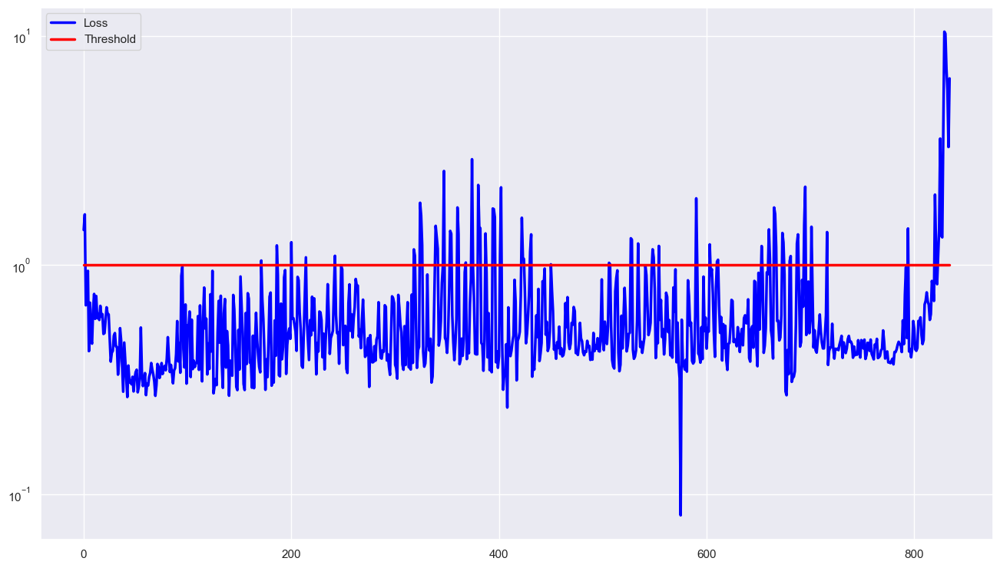

In [165]:
sns.set(style='dark')
score_test.plot(logy=True, figsize=(16,9), color=['blue','red'],linewidth=2.5)
plt.savefig('all_pics/score_plot_test_all.png', dpi=300)
plt.grid()
# Отображение графика
plt.show()

In [166]:
score_test.head()

,Loss,Threshold,Anomaly
0,1.423822,1,True
1,1.664465,1,True
2,0.667751,1,False
3,0.858492,1,False
4,0.943429,1,False


In [167]:
test_pred

[array([[[0.804069  , 1.01155   , 0.68916774, 0.00622453, 0.45491877,
          0.14288944, 0.25318748, 0.83123386, 0.5488127 , 0.42987743,
          0.87867635, 0.58194363, 0.29649353, 0.7864357 , 0.46502835,
          1.0458407 , 0.9676334 , 0.5061913 , 0.04143429, 0.47203487,
          0.46274573]]], dtype=float32),
 array([[[ 0.61335003,  0.05558265,  0.46001652, -0.00261688,
           0.39790666,  0.13992089,  0.41494715,  0.0824355 ,
           0.5513003 ,  0.172286  ,  0.08247101,  0.5210487 ,
           0.43794462,  0.0872722 ,  0.34040266,  0.8880833 ,
           0.07890302,  0.52297294,  0.0990086 ,  0.16051109,
           1.7004915 ]]], dtype=float32),
 array([[[0.7254675 , 0.06912507, 0.20747802, 0.0069155 , 0.6572536 ,
          0.14358039, 0.3703309 , 0.11525987, 0.31388414, 0.15487148,
          0.07180746, 0.42332986, 0.31307793, 0.0872708 , 0.4904849 ,
          0.9672683 , 0.10543115, 0.5083211 , 0.16638424, 0.16109674,
          0.76817644]]], dtype=float32),
 array

In [ ]:
# Функция для восстановления временных рядов
def restore_time_series(predictions, columns):
    restored_columns = {}
    for column in columns:
        real_col = f'{column}_fft_real'
        imag_col = f'{column}_fft_imag'
        
        if real_col in predictions and imag_col in predictions:
            fft_real = predictions[real_col].to_numpy()
            fft_imag = predictions[imag_col].to_numpy()
            restored_columns[column] = apply_ifft(fft_real, fft_imag)
    return pd.DataFrame(restored_columns)

In [ ]:
# Преобразование предсказаний в массив NumPy
predictions_np = np.array(test_pred).reshape(-1, len(fft_test.columns))

# Восстановление временных рядов
restored_df = restore_time_series(predictions_np, columns)

In [ ]:
predictions_np.shape

In [ ]:
predictions_df

In [ ]:
restored_df.shape

In [ ]:
# combo_data_np = torch.cat([batch for batch in combo_loader], dim=0).detach().cpu().numpy()

# # 2. Перестроить данные в подходящий формат для построения графиков
# combo_data_np = combo_data_np.reshape(-1, seq_len, n_features)

# # 3. Получить предсказания модели
# preds = []
# with torch.no_grad():
#     model = model.eval()
#     for seq_true in combo_loader:
#         seq_true = seq_true.to(args.device)
#         seq_true = seq_true.reshape((-1, seq_len, n_features))

#         seq_pred = model(seq_true)
#         preds.append(seq_pred.cpu().numpy())
# preds = np.concatenate(preds, axis=0)

# # 4. Создать подграфики для каждой фичи
# fig, axs = plt.subplots(n_features, 1, figsize=(10, n_features * 3))

# # 5. Построить график для каждой фичи
# for i in range(n_features):
    

#     line2, = axs[i].plot(preds[:, 0, i], color='orange', label='predictions')
#     line1, = axs[i].plot(combo_data_np[:, 0, i], color='blueviolet', label='original data')
#     for j in range(1, seq_len):
#         axs[i].plot(combo_data_np[:, j, i], color='blueviolet')
#         axs[i].plot(preds[:, j, i], color='orange')
#     axs[i].set_title(f'Feature {i}')
#     axs[i].legend(handles=[line1, line2])
# # plt.savefig('preds/original 3d.png', dpi=300)
# plt.tight_layout()

# plt.show()
